# Summary

Pour la suite du cours, nous allons faire l'apprentissage par la pratique avec un cas réel de projet de Machine Learning

Description du projet: Prédire le prix des biens immobiliers à Ames, Iowa.

Les données sont disponibles dans: [sklearn.datasets](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_openml.html#sklearn.datasets.fetch_openml)


Voici un récapitulatif des objectifs :
- Réaliser une analyse exploratoire.
- Tester différents modèles de prédiction afin de répondre au mieux à la problématique.

__Sources utiles__

- [Introduction à MLOps](https://ashutoshtripathi.com/2021/08/18/mlops-a-complete-guide-to-machine-learning-operations-mlops-vs-devops/)

- [MLFLOW - Site de référence](https://mlflow.org/docs/latest/index.html)
- [MLFLOW - Tutorial](https://mlflow.org/docs/latest/tutorials-and-examples/tutorial.html)
- [MLFLOW - Tracking](https://mlflow.org/docs/latest/tracking.html)
- [MLFLOW - Model Registry](https://mlflow.org/docs/latest/model-registry.html#)
- [MLFLOW - Serve a model](https://mlflow.org/docs/latest/model-registry.html#serving-an-mlflow-model-from-model-registry)

- [Evidently - tutorial d'analyse de Data drift](https://github.com/evidentlyai/evidently/tree/main/examples/sample_notebooks)
- [API Flask - Démarche de mise en oeuvre](http://web.univ-ubs.fr/lmba/lardjane/python/c4.pdf)
- [FastAPI - Démarche de mise en oeuvre](https://towardsdatascience.com/how-to-build-and-deploy-a-machine-learning-model-with-fastapi-64c505213857)
- [Azure - Tuto déploiement application web ](https://learn.microsoft.com/fr-fr/azure/app-service/quickstart-python?tabs=flask%2Cwindows%2Cazure-portal%2Cvscode-deploy%2Cdeploy-instructions-azportal%2Cterminal-bash%2Cdeploy-instructions-zip-azcli)
- [Tests unitaires - Unittest ou Pytest](https://www.sitepoint.com/python-unit-testing-unittest-pytest/)

- [Pythonanywhere](https://www.pythonanywhere.com/)
- [Heroku](https://www.heroku.com/)
-[Azure webapp - Déploiement automatisé via Github](https://learn.microsoft.com/fr-fr/azure/app-service/deploy-continuous-deployment?tabs=github)
- Streamlit ou gradio pour la mise en place d'un dashbord


# Import librairies

In [70]:
%reload_ext autoreload
%autoreload 2

import sys
from pathlib import Path

import mlflow
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import pendulum
import plotly.express as px
import ppscore as pps
import seaborn as sns
from loguru import logger
from mlflow.models import infer_signature
from sklearn import set_config
from sklearn.compose import (
    ColumnTransformer,
    make_column_selector,
    TransformedTargetRegressor,
)
from sklearn.datasets import fetch_openml
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import (
    RandomForestRegressor,
    AdaBoostRegressor,
    VotingRegressor,
    GradientBoostingRegressor,
)
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, RidgeCV
from sklearn.metrics import (
    r2_score,
    root_mean_squared_error,
    mean_absolute_percentage_error,
    mean_absolute_error,
    max_error,
)
from sklearn.model_selection import (
    train_test_split,
    learning_curve,
    LearningCurveDisplay,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    OneHotEncoder,
)
from ydata_profiling import ProfileReport
from yellowbrick.regressor import PredictionError, ResidualsPlot

sys.path.append(str(Path.cwd().parent))
from settings.params import MODEL_PARAMS, SEED
from src.make_dataset import load_data


pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
set_config(
    display="diagram", print_changed_only=False
)  # display sklearn pipeline as diagram

# Settings

In [2]:
# Set logging format
log_fmt = "<green>{time:YYYY-MM-DD HH:mm:ss.SSS!UTC}</green> | <level>{level: <8}</level> | <cyan>{name}</cyan>:<cyan>{function}</cyan>:<cyan>{line}</cyan> - {message}"
logger.configure(handlers=[{"sink": sys.stderr, "format": log_fmt}])

# current data
CURRENT_DATE = pendulum.now(tz="UTC")

# target name definition
TARGET_NAME = MODEL_PARAMS["TARGET_NAME"]
logger.info(f"Target name: {TARGET_NAME}")


# directories
PROJECT_DIR = Path.cwd().parent
REPORTS_DIR = Path(PROJECT_DIR, "reports")

logger.info(f"\nProject directory: {PROJECT_DIR} \nReports dir: {REPORTS_DIR}")

2024-06-29 09:03:21.850 | INFO     | __main__:<module>:10 - Target name: SalePrice
2024-06-29 09:03:21.851 | INFO     | __main__:<module>:17 - 
Project directory: C:\Users\mously.diaw\Documents\house_price 
Reports dir: C:\Users\mously.diaw\Documents\house_price\reports


In [3]:
MODEL_PARAMS

{'TARGET_NAME': 'SalePrice',
 'MIN_COMPLETION_RATE': 0.75,
 'MIN_PPS': 0.1,
 'DEFAULT_FEATURE_NAMES': ['Alley',
  'BsmtQual',
  'ExterQual',
  'Foundation',
  'FullBath',
  'GarageArea',
  'GarageCars',
  'GarageFinish',
  'GarageType',
  'GrLivArea',
  'KitchenQualMSSubClass',
  'Neighborhood',
  'OverallQual',
  'TotRmsAbvGrd',
  'building_age',
  'remodel_age',
  'garage_age'],
 'TEST_SIZE': 0.25}

# Data collection

In [4]:
# get data like pandas.DataFrame
data = load_data(dataset_name="house_prices")
data.shape

2024-06-29 09:03:22.156 | INFO     | src.make_dataset:load_data:23 - Dataset lo load: house_prices
2024-06-29 09:03:22.179 | INFO     | src.make_dataset:load_data:29 - Data shape: (1460, 81)
2024-06-29 09:03:22.180 | INFO     | src.make_dataset:load_data:30 - Data description: Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
       

(1460, 81)

In [5]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,'Wd Sdng','Wd Shng',None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
# Cast some columns to str
data = data.astype(
    {
        "YearBuilt": str,
        "YearRemodAdd": str,
        "GarageYrBlt": str,
        "MoSold": str,
        "YrSold": str,
    }
)

In [8]:
data.describe(include="all", datetime_is_numeric=True)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460,1460,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1460,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460,1460,1460,1460,1460.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,112,61,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,98,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,12,5,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,2006,1950,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,nan,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,6,2009,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,67,178,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,81,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,253,338,1267,1198,NaN
mean,730.500000,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,NaN,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,NaN,NaN,NaN,NaN,180921.195890
std,421.610009,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,NaN,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,NaN,NaN,NaN,NaN,79442.502883
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,34900.00

# EDA: Exploratory Data Analysis

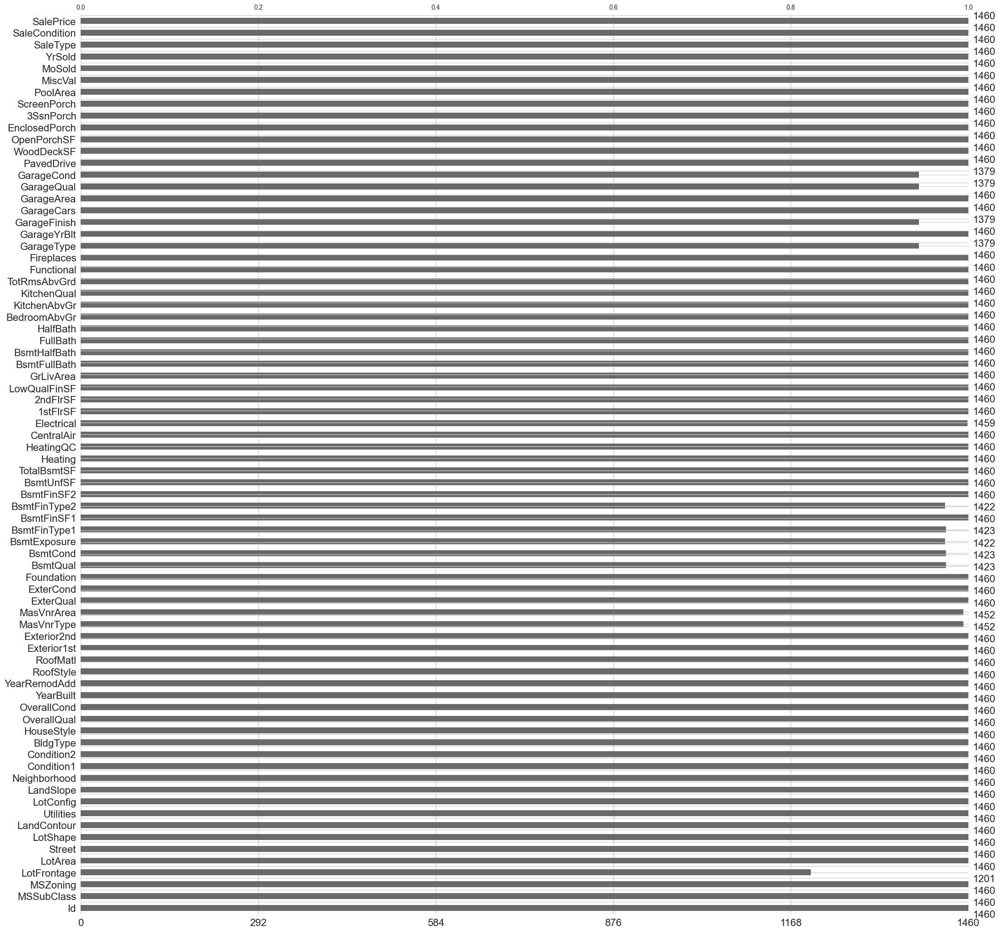

In [9]:
# barplot for missing value rate
msno.bar(
    data,
    filter="top",
    p=MODEL_PARAMS["MIN_COMPLETION_RATE"],
);

## Target analysis

Todo:

    1- Ajouter un parameter dans le dictionnaire MODEL_PARAMS, appelé TARGET_NAME, qui prend la valeur "SalePrice"

    2- Construite l'histogramme de la variable cible en récupérant le nom depuis le dictionnaire MODEL_PARAMS
    3- Construire un 2e graphique sur la même ligne (variable target transformer en log)
    4- Continuer l'analyse exploratoire des variables  explicatives (quanti et quali)
    5- Faire une première sélection des variables explicatives à utiliser pour le modèle 
    6- Ajouter dans MODEL_PARAMS, un key appelé FEATURE_NAMES, qui stocke la liste des variables explicatives sélectionnées

In [10]:
MODEL_PARAMS["TARGET_NAME"]

'SalePrice'

In [11]:
# Target: stat description
data[TARGET_NAME].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

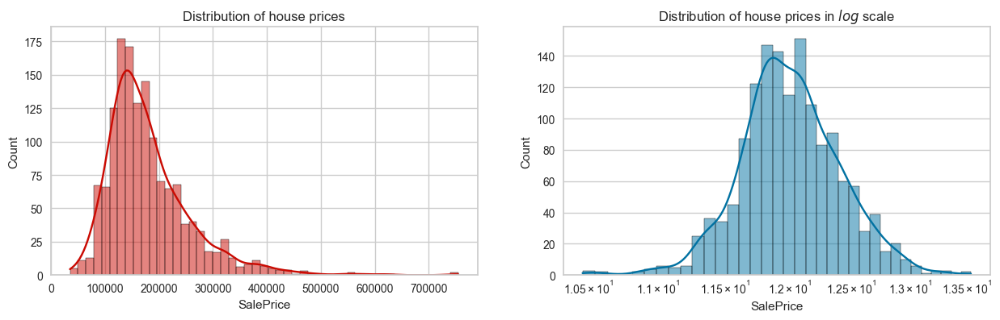

In [12]:
# Target distribution: raw vs log (box-cox transformation)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

sns.histplot(data[TARGET_NAME], color="r", kde=True, ax=axes[0])
axes[0].set_title("Distribution of house prices")

sns.histplot(np.log(data[TARGET_NAME]), color="b", kde=True, ax=axes[1])
axes[1].set_title("Distribution of house prices in $log$ scale")
axes[1].set_xscale("log");

## Feature engineering

In [13]:
# add age columns
data = data.assign(
    building_age=lambda dfr: dfr.YrSold.astype(float) - dfr.YearBuilt.astype(float),
    remodel_age=lambda dfr: dfr.YrSold.astype(float) - dfr.YearRemodAdd.astype(float),
    garage_age=lambda dfr: dfr.YrSold.astype(float) - dfr.GarageYrBlt.astype(float),
)
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,building_age,remodel_age,garage_age
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,5.0,5.0,5.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,31.0,31.0,31.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,7.0,6.0,7.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,'Wd Sdng','Wd Shng',None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,91.0,36.0,8.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,8.0,8.0,8.0


## Univariate analysis

In [14]:
categorical_features = data.select_dtypes(include=["object", "bool"]).columns
logger.info(f"Categorical features:\n {sorted(categorical_features)}\n")

numerical_features = (
    data.select_dtypes(include="number").drop(["Id", TARGET_NAME], axis=1).columns
)
logger.info(f"Numerical features:\n {sorted(numerical_features)}")

2024-06-29 09:03:25.833 | INFO     | __main__:<module>:2 - Categorical features:
 ['Alley', 'BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'CentralAir', 'Condition1', 'Condition2', 'Electrical', 'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu', 'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType', 'GarageYrBlt', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenQual', 'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 'MSZoning', 'MasVnrType', 'MiscFeature', 'MoSold', 'Neighborhood', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street', 'Utilities', 'YearBuilt', 'YearRemodAdd', 'YrSold']

2024-06-29 09:03:25.836 | INFO     | __main__:<module>:5 - Numerical features:
 ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtUnfSF', 'EnclosedPorch', 'Fireplaces', 'FullBath', 'GarageArea', 'GarageCa

## Bivariate analysis

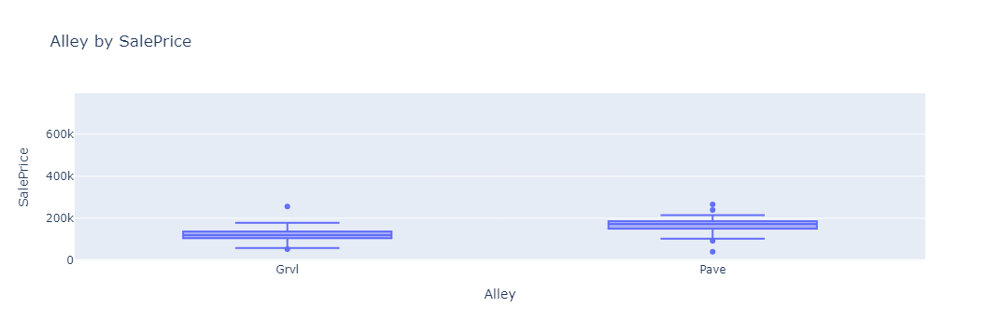

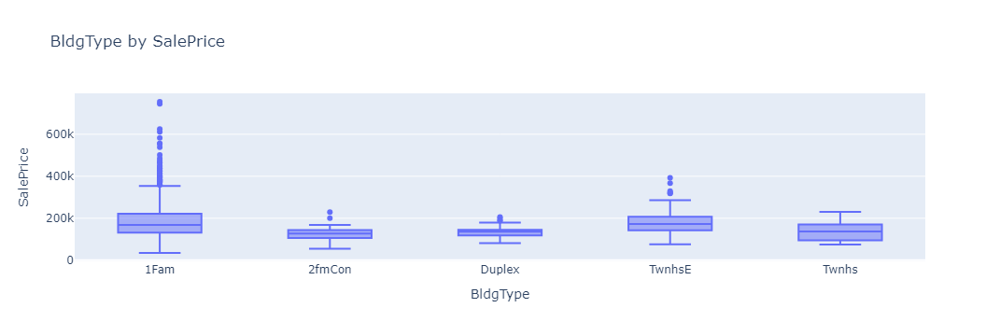

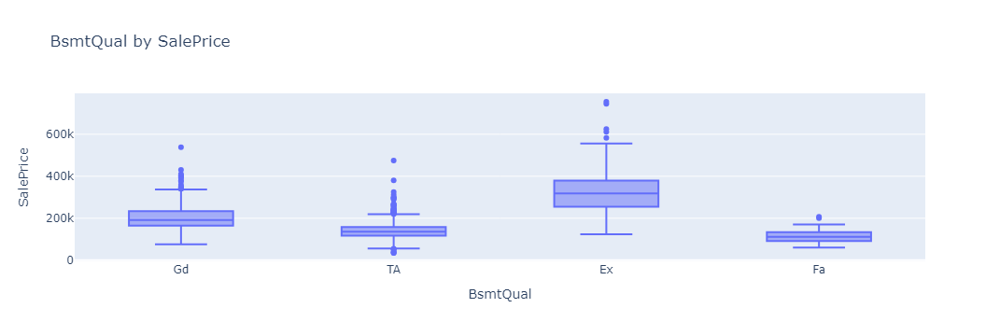

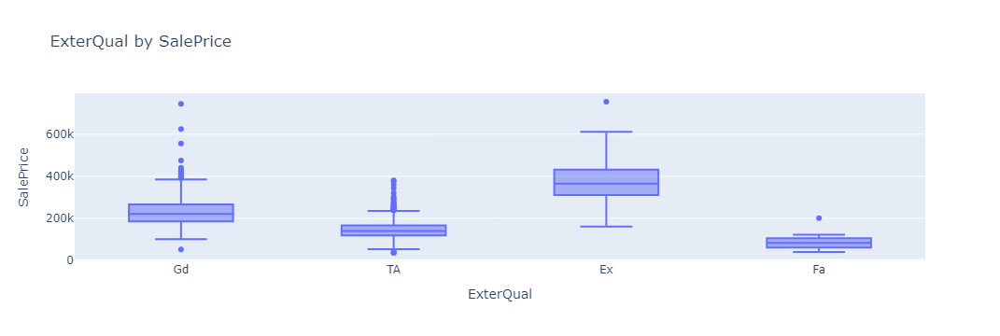

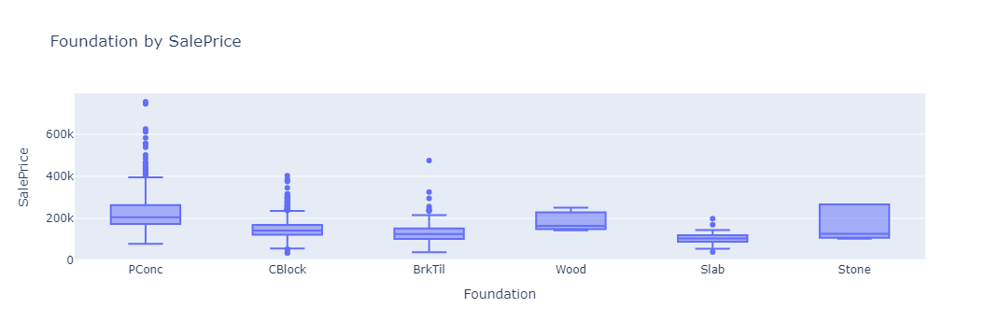

...

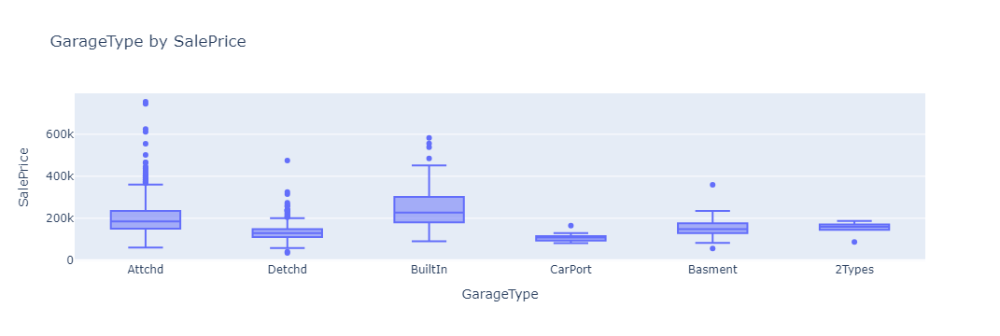

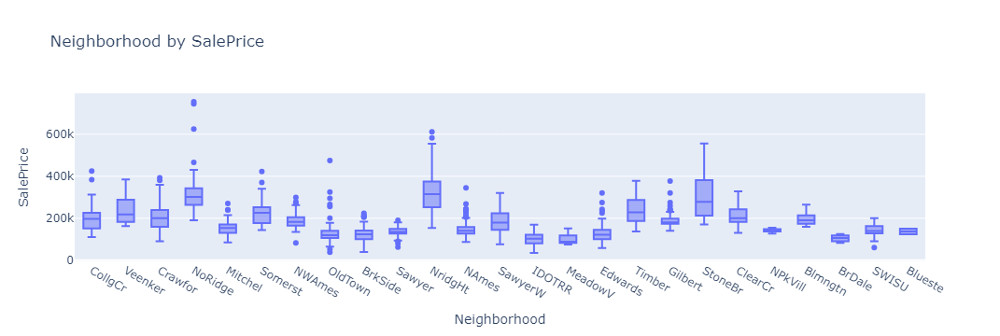

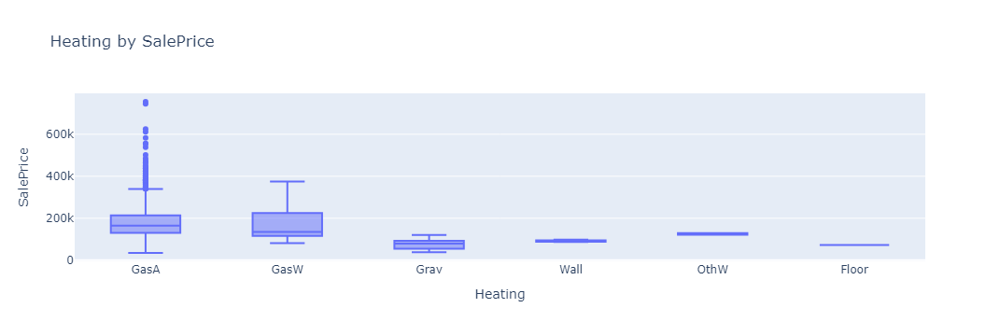

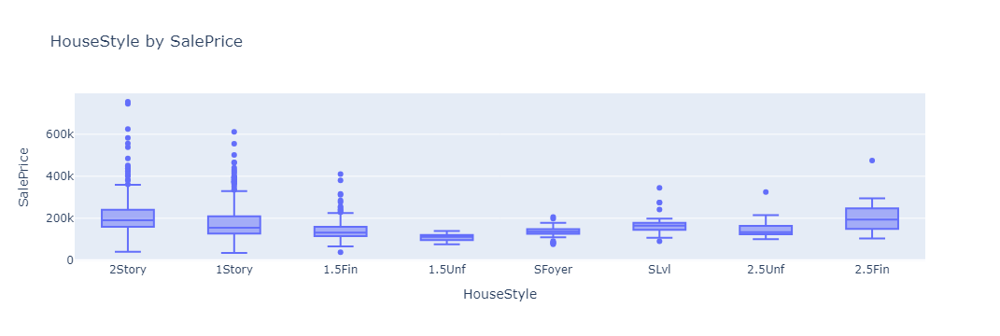

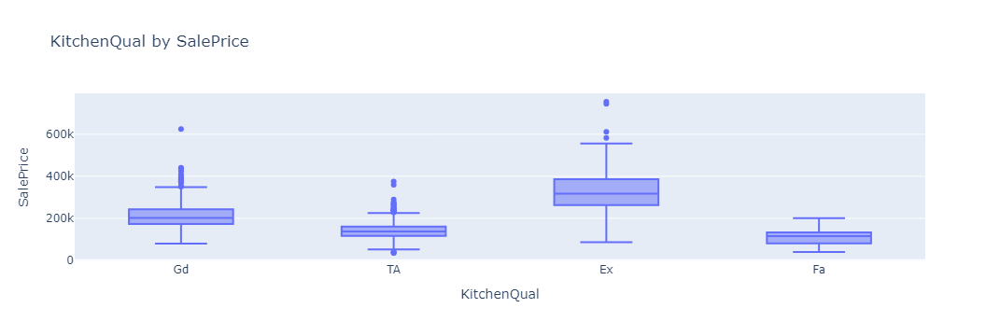

In [15]:
for cat_col_name in [
    "Alley",
    "BldgType",
    "BsmtQual",
    "ExterQual",
    "Foundation",
    "GarageFinish",
    "GarageType",
    "Neighborhood",
    "Heating",
    "HouseStyle",
    "KitchenQual",
]:
    fig = px.box(
        data_frame=data,
        x=cat_col_name,
        y=TARGET_NAME,
        title=f"{cat_col_name} by {TARGET_NAME}",
    )
    fig.show()

<AxesSubplot: xlabel='Heating', ylabel='HouseStyle'>

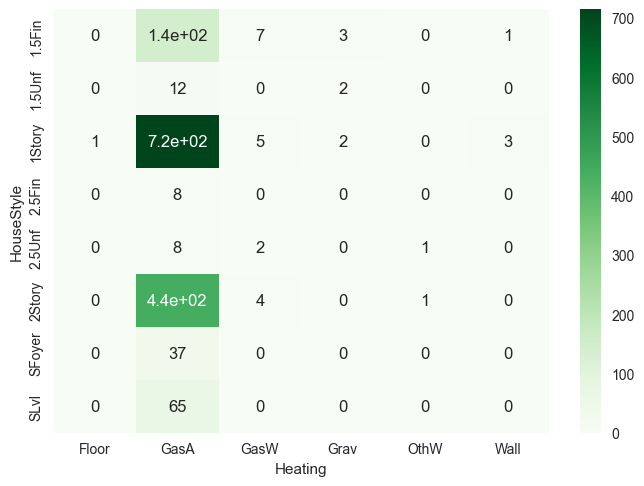

In [16]:
sns.heatmap(
    pd.crosstab(
        index=data.HouseStyle,  # type de logement
        columns=data.Heating,  # Type de chauffage
        margins=False,
        margins_name="Total",
        dropna=False,
    ),
    cmap="Greens",
    annot=True,
    fmt=".2g",
)

In [17]:
set(numerical_features) & set(MODEL_PARAMS["DEFAULT_FEATURE_NAMES"])

{'FullBath',
 'GarageArea',
 'GarageCars',
 'GrLivArea',
 'OverallQual',
 'TotRmsAbvGrd',
 'building_age',
 'garage_age',
 'remodel_age'}

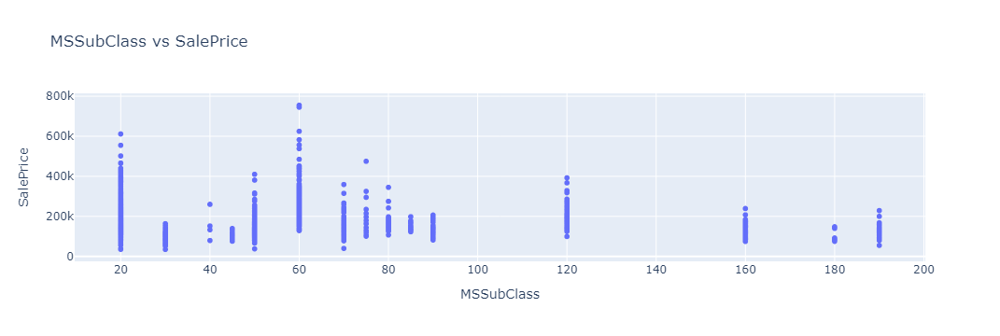

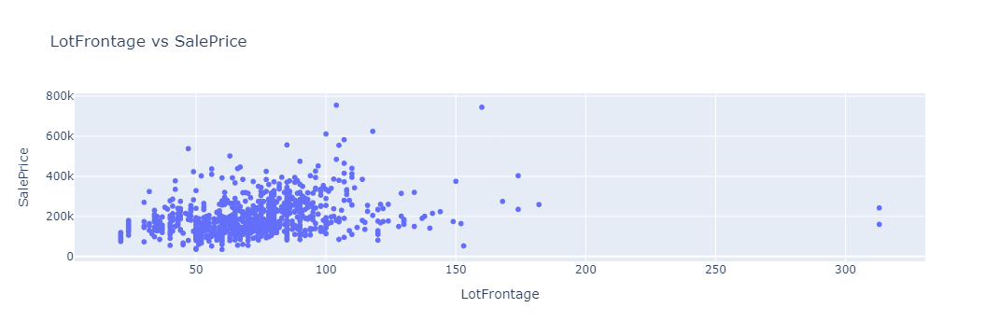

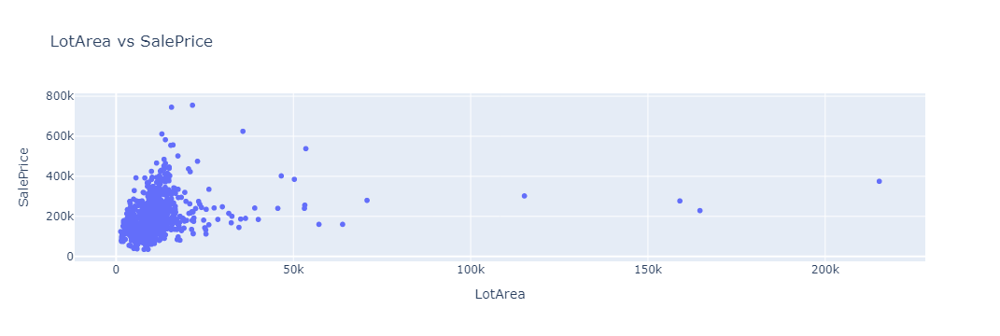

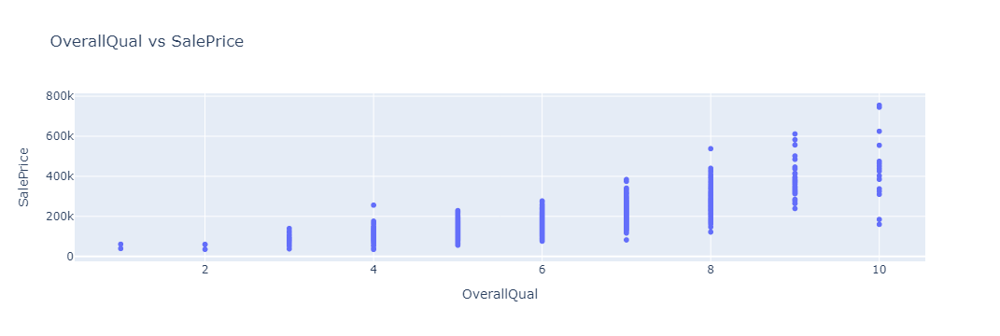

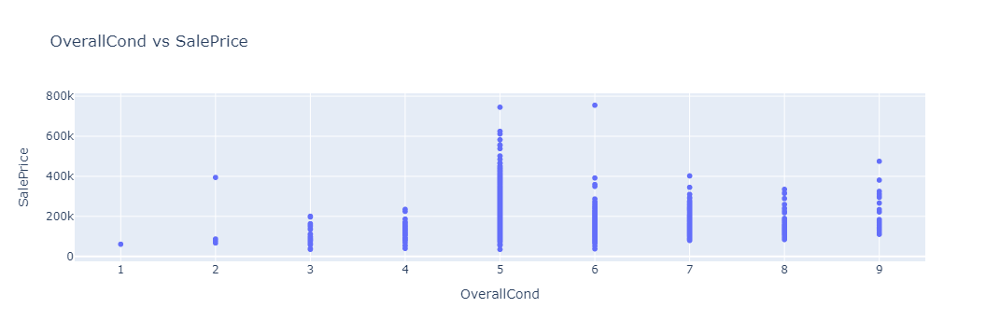

...

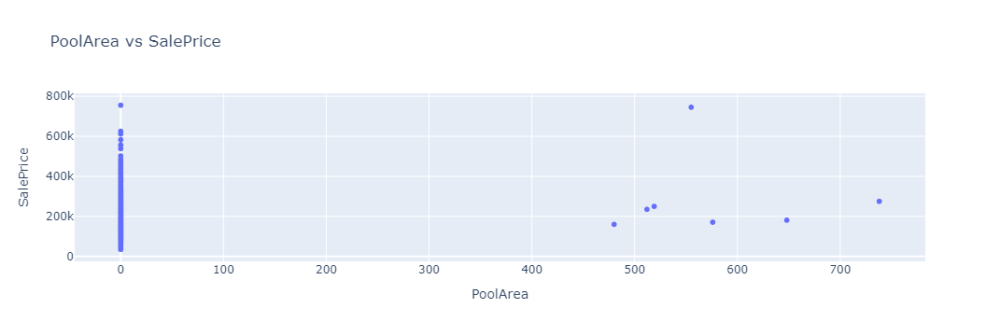

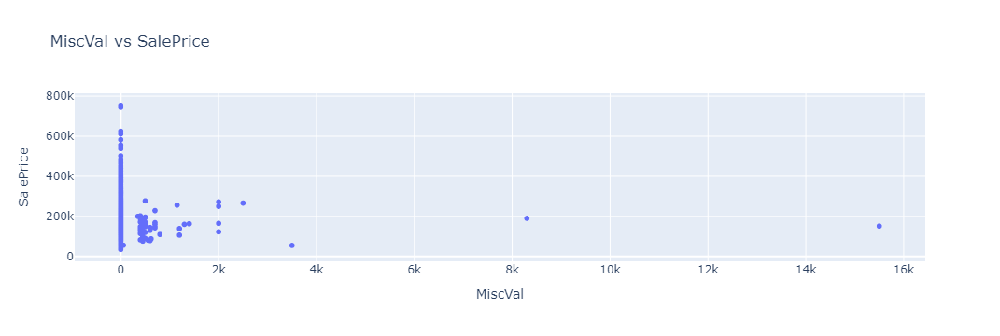

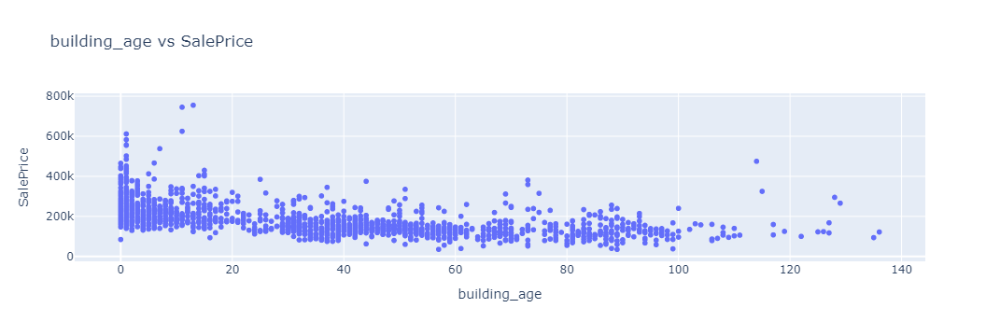

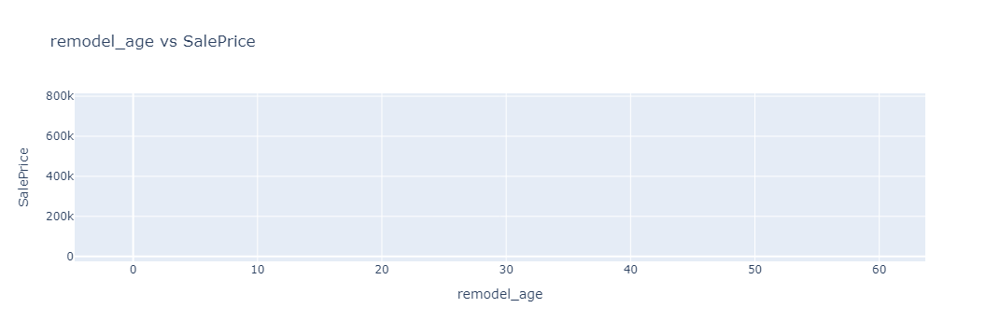

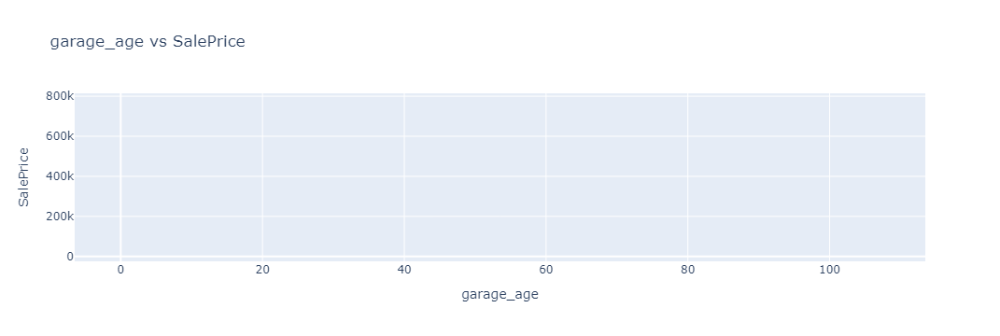

In [18]:
for num_col_name in numerical_features:
    fig = px.scatter(
        data_frame=data,
        x=num_col_name,
        y=TARGET_NAME,
        title=f"{num_col_name} vs {TARGET_NAME}",
    )
    fig.show()

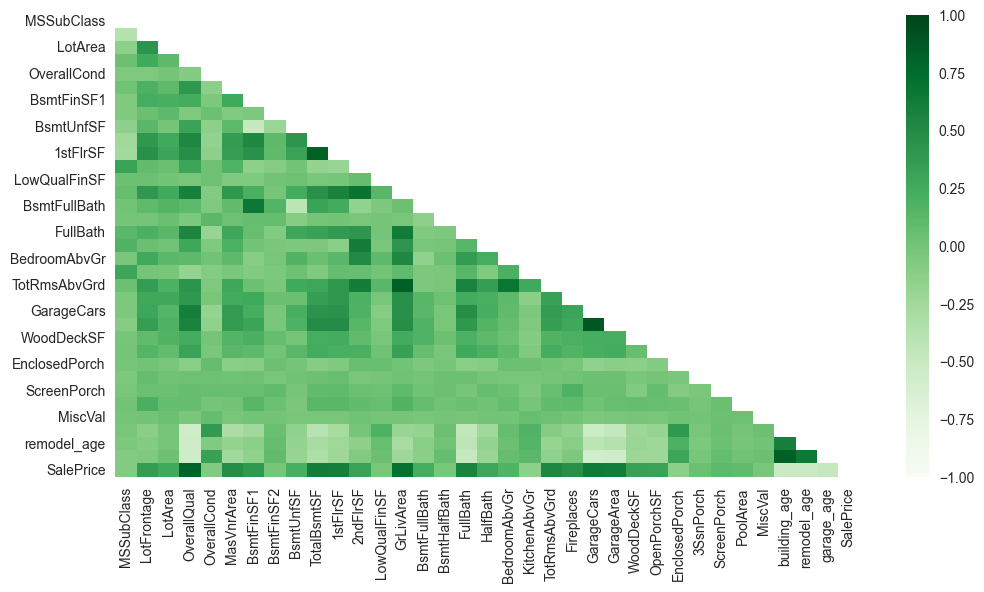

In [19]:
# correlation
num_correlation = data.loc[:, list(numerical_features) + [TARGET_NAME]].corr(
    method="pearson", numeric_only=True
)

# Getting the Upper Triangle of the co-relation matrix
mask = np.triu(num_correlation)

plt.figure(figsize=(12, 6))
sns.heatmap(
    num_correlation,
    vmin=-1,
    vmax=1,
    annot=False,
    mask=mask,
    fmt=".2f",
    square=False,
    cmap="Greens",
);

## Data profiling

## Features selection

In [20]:
SEED

42

In [21]:
# Predictive Power Score (PPS) : https://github.com/8080labs/ppscore/
pps_predictors = pps.predictors(
    df=data.drop(["Id", "YrSold", "YearBuilt", "YearRemodAdd", "GarageYrBlt"], axis=1),
    y=TARGET_NAME,
    output="df",
    random_seed=SEED,
)

In [22]:
pps_predictors

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,OverallQual,SalePrice,0.444021,regression,True,mean absolute error,55533.656164,30875.568225,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
1,Neighborhood,SalePrice,0.337573,regression,True,mean absolute error,55533.656164,36786.967628,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
2,GarageCars,SalePrice,0.298869,regression,True,mean absolute error,55533.656164,38936.361994,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
3,ExterQual,SalePrice,0.275945,regression,True,mean absolute error,55533.656164,40209.410056,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
4,BsmtQual,SalePrice,0.267740,regression,True,mean absolute error,55400.797611,40567.772895,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
5,KitchenQual,SalePrice,0.263696,regression,True,mean absolute error,55533.656164,40889.655962,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
6,building_age,SalePrice,0.192380,regression,True,mean absolute error,55533.656164,44850.101011,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
7,FullBath,SalePrice,0.192349,regression,True,mean absolute error,55533.656164,44851.838100,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
8,Alley,SalePrice,0.175269,regression,True,mean absolute error,33871.626374,27934.963987,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."
9,GarageArea,SalePrice,0.174296,regression,True,mean absolute error,55533.656164,45854.385436,"DecisionTreeRegressor(ccp_alpha=0.0, criterion..."


In [23]:
pps.__version__

'1.3.0'

In [24]:
# check if there are invalide pps scores in the output
pps_predictors.is_valid_score.value_counts()

True    78
Name: is_valid_score, dtype: int64

In [25]:
# get feature names
FEATURE_NAMES = pps_predictors.loc[
    pps_predictors.ppscore >= MODEL_PARAMS["MIN_PPS"], "x"
].values
set(FEATURE_NAMES)

{'Alley',
 'BsmtQual',
 'ExterQual',
 'Foundation',
 'FullBath',
 'GarageArea',
 'GarageCars',
 'GarageFinish',
 'GarageType',
 'GrLivArea',
 'KitchenQual',
 'MSSubClass',
 'Neighborhood',
 'OverallQual',
 'TotRmsAbvGrd',
 'building_age',
 'garage_age',
 'remodel_age'}

__Data leakage__

Attention à la fuite des données.

Des variables importantes alors qu'elles ne seront pas disponibles lors de la prédiction (exemple: SaleCondition)

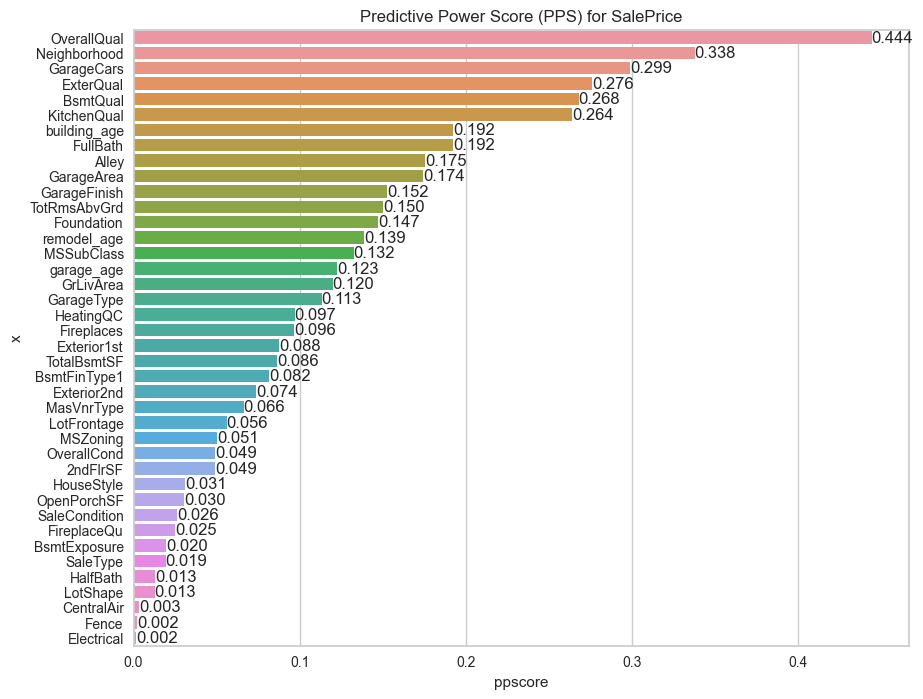

In [26]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=pps_predictors.loc[lambda dfr: dfr.ppscore > 0], y="x", x="ppscore", orient="h"
)
ax.set_title(f"Predictive Power Score (PPS) for {TARGET_NAME}")

# add the annotation
ax.bar_label(ax.containers[-1], fmt="%.3f", label_type="edge");

# Modeling

## Pipeline

![mlflow-tracking](https://mlflow.org/docs/latest/_images/quickstart_tracking_overview.png)

In [27]:
from typing import Union, Dict, Any


def eval_metrics(
    y_actual: Union[pd.DataFrame, pd.Series, np.ndarray],
    y_pred: Union[pd.DataFrame, pd.Series, np.ndarray],
) -> Dict[str, float]:
    """Compute evaluation metrics.

    Args:
        y_actual: Ground truth (correct) target values
        y_pred: Estimated target values.

    Returns:
        Dict[str, float]: dictionary of evaluation metrics.
            Expected keys are: "rmse", "mae", "mape", "r2", "max_error"

    """
    # Calculate Root mean squared error, named rmse
    rmse = root_mean_squared_error(y_actual, y_pred)
    # Calculate mean absolute error, named mae
    mae = mean_absolute_error(y_actual, y_pred)
    # Mean absolute percentage error (MAPE)
    mape = mean_absolute_percentage_error(y_actual, y_pred)
    # Calculate R-squared: coefficient of determination, named r2
    r2 = r2_score(y_actual, y_pred)
    # Calculate max error: maximum value of absolute error (y_actual - y_pred), named maxerror
    maxerror = max_error(y_actual, y_pred)
    return {"rmse": rmse, "mae": mae, "mape": mape, "r2": r2, "max_error": maxerror}

In [28]:
def define_pipeline(
    numerical_transformer: list,
    categorical_transformer: list,
    estimator: Pipeline,
    target_transformer: bool = False,
    **kwargs: dict
) -> Pipeline:
    """Define pipeline for modeling.

    Args:
        numerical_transformer:
        categorical_transformer:
        target_transformer:
        estimator:
        kwargs:

    Returns:
        Pipeline: sklearn pipeline
    """
    numerical_transformer = make_pipeline(*numerical_transformer)

    categorical_transformer = make_pipeline(*categorical_transformer)

    preprocessor = ColumnTransformer(
        transformers=[
            (
                "num",
                numerical_transformer,
                make_column_selector(dtype_include=["number"]),
            ),
            (
                "cat",
                categorical_transformer,
                make_column_selector(dtype_include=["object", "bool"]),
            ),
        ],
        remainder="drop",  # non-specified columns are dropped
        verbose_feature_names_out=False,  # will not prefix any feature names with the name of the transformer
    )
    # Append regressor to preprocessing pipeline.
    # Now we have a full prediction pipeline.
    if target_transformer:
        model_pipe1 = Pipeline(
            steps=[("preprocessor", preprocessor), ("estimator", estimator)]
        )
        model_pipe = TransformedTargetRegressor(
            regressor=model_pipe1, func=np.log, inverse_func=np.exp
        )

    else:
        model_pipe = Pipeline(
            steps=[("preprocessor", preprocessor), ("estimator", estimator)]
        )

    # logger.info(f"{model_pipe}")
    return model_pipe

## Train / Test split

In [29]:
# Séparer les données en train et test (25%)

FEATURES = (
    FEATURE_NAMES if any(FEATURE_NAMES) else MODEL_PARAMS["DEFAULT_FEATURE_NAMES"]
)

x_train, x_test, y_train, y_test = train_test_split(
    data.loc[:, FEATURES],
    data[TARGET_NAME],
    test_size=MODEL_PARAMS["TEST_SIZE"],
    random_state=SEED,
)

logger.info(
    f"\nX train: {x_train.shape}\nY train: {y_train.shape}\n"
    f"X test: {x_test.shape}\nY test: {y_test.shape}"
)

2024-06-29 09:03:34.400 | INFO     | __main__:<module>:11 - 
X train: (1095, 18)
Y train: (1095,)
X test: (365, 18)
Y test: (365,)


## Baseline

In [30]:
# Model definition
reg = define_pipeline(
    numerical_transformer=[SimpleImputer(strategy="median"), RobustScaler()],
    categorical_transformer=[
        SimpleImputer(strategy="constant", fill_value="undefined"),
        OneHotEncoder(drop="if_binary", handle_unknown="ignore"),
    ],
    target_transformer=False,
    estimator=RandomForestRegressor(n_estimators=30),
)

reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('simpleimputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median')),
                                                                  ('robustscaler',
                                                                   Robust...
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='squared_error',
                                       max_depth=None, max_features=1.0,
                                       max_leaf_nodes=None, max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       monotonic_cst=None, n_estimators=30,
                                       n_jobs=None, oob_score=False,
                                       random_state=None, verbose=0,
                                       warm_start=False))],
         verbose=False)

### Training

In [31]:
# model training and selection

reg.fit(x_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('simpleimputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median')),
                                                                  ('robustscaler',
                                                                   Robust...
                 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                       criterion='squared_error',
                                       max_depth=None, max_features=1.0,
                                       max_leaf_nodes=None, max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       monotonic_cst=None, n_estimators=30,
                                       n_jobs=None, oob_score=False,
                                       random_state=None, verbose=0,
                                       warm_start=False))],
         verbose=False)

### Model evaluation

In [32]:
# evaluate trained model: sur le train et le test set

# Calcule the evaluation metrics
y_train_pred = reg.predict(x_train)
y_test_pred = reg.predict(x_test)
train_metrics = eval_metrics(y_train, y_train_pred)
test_metrics = eval_metrics(y_test, y_test_pred)

# log out metrics
logger.info(
    f"""Performances\n{pd.DataFrame({"train": train_metrics, "test": test_metrics}).T}"""
)

2024-06-29 09:03:36.069 | INFO     | __main__:<module>:10 - Performances
               rmse           mae      mape        r2      max_error
train  12569.569110   7766.107093  0.045221  0.973978  104582.733333
test   29351.406028  19217.903014  0.117304  0.877021  186643.166667


#### Residuals analysis

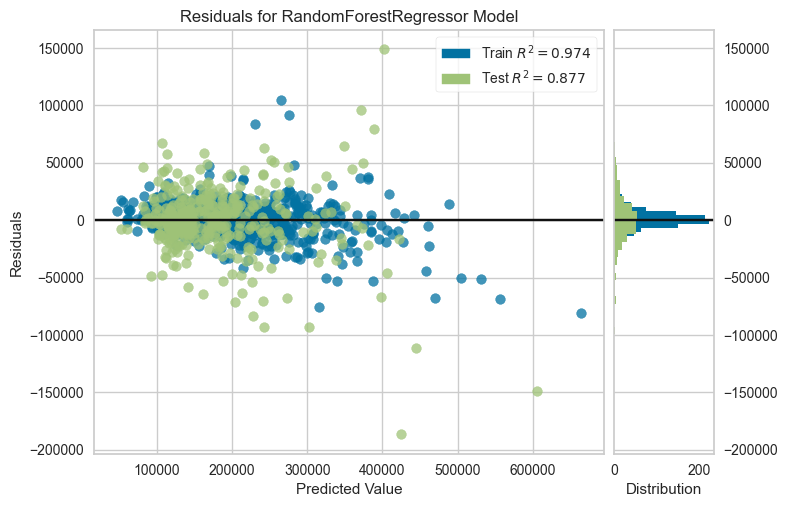

In [33]:
visualizer = ResidualsPlot(reg, is_fitted="auto")

visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show();  # Finalize and render the figure

#### Prediction plot

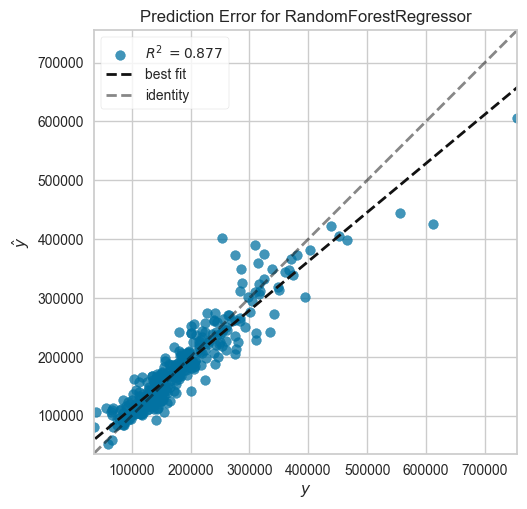

In [34]:
visualizer = PredictionError(reg, is_fitted="auto", bestfit=True, identity=True)

visualizer.fit(x_train, y_train)  # Fit the training data to the visualizer
visualizer.score(x_test, y_test)  # Evaluate the model on the test data
visualizer.show();  # Finalize and render the figure

### Tester l'un des packages suivants:

__Exo 1__:

1- [PyCaret](https://pycaret.org/): An open source, low-code machine learning library in Python.

2- [LazyPredict](https://pypi.org/project/lazypredict/): Lazy Predict help build a lot of basic models without much code and helps understand which models works better without any parameter tuning


__Exo 2__:

1- Tester la prédiction avec la variable logarithmique


__Exo3__: 
1- Consulter la document de mlflow via les liens précisés au début du notebook



import pycaret.regression as pyr
from lazypredict.Supervised import LazyRegressor


### Tracking

In [55]:
# Create an experiment if not exists
exp_name = "house-price"
experiment = mlflow.get_experiment_by_name(exp_name)
if not experiment:
    experiment_id = mlflow.create_experiment(exp_name)
else:
    experiment_id = experiment.experiment_id

logger.info(f"Experience id: {experiment_id}")

In [66]:
# Define models and parameters to benchmark
ESTIMATOR_PARAMS = {
    DummyRegressor.__name__: {
        "estimator": DummyRegressor,
        "params": {"strategy": "median"},
    },
    RandomForestRegressor.__name__: {
        "estimator": RandomForestRegressor,
        "params": {"n_estimators": 30, "max_depth": 3, "random_state": SEED},
    },
    GradientBoostingRegressor.__name__: {
        "estimator": GradientBoostingRegressor,
        "params": {
            "n_estimators": 30,
            "learning_rate": 0.01,
            "max_depth": 3,
            "random_state": SEED,
        },
    },
}

ESTIMATOR_PARAMS

{'DummyRegressor': {'estimator': sklearn.dummy.DummyRegressor,
  'params': {'strategy': 'median'}},
 'RandomForestRegressor': {'estimator': sklearn.ensemble._forest.RandomForestRegressor,
  'params': {'n_estimators': 30, 'max_depth': 3, 'random_state': 42}},
 'GradientBoostingRegressor': {'estimator': sklearn.ensemble._gb.GradientBoostingRegressor,
  'params': {'n_estimators': 30,
   'learning_rate': 0.01,
   'max_depth': 3,
   'random_state': 42}}}

In [68]:
for model_name, model_configs in ESTIMATOR_PARAMS.items():
    logger.info(f"{model_name} \n{model_configs}")

    estimator = model_configs["estimator"]
    params = model_configs["params"]

    # Useful for multiple runs (only doing one run in this sample notebook)
    with mlflow.start_run(
        run_name=f"{CURRENT_DATE.strftime('%Y%m%d_%H%m%S')}-house_price-{model_name}",
        experiment_id=experiment_id,
        tags={"version": "v1", "priority": "P1"},
        description="house price modeling",
    ) as mlf_run:
        logger.info(f"run_id: {mlf_run.info.run_id}")
        logger.info(
            f"version tag value: {mlf_run.data.tags.get('version')} -------------------------------"
        )

        # log parameters
        mlflow.log_params(params)

        # Model definition
        reg = define_pipeline(
            numerical_transformer=[SimpleImputer(strategy="median"), RobustScaler()],
            categorical_transformer=[
                SimpleImputer(strategy="constant", fill_value="undefined"),
                OneHotEncoder(drop="if_binary", handle_unknown="ignore"),
            ],
            target_transformer=False,
            estimator=estimator(**params),
        )

        reg.fit(x_train, y_train)

        # Evaluate Metrics
        y_train_pred = reg.predict(x_train)
        y_test_pred = reg.predict(x_test)
        train_metrics = eval_metrics(y_train, y_train_pred)
        test_metrics = eval_metrics(y_test, y_test_pred)

        # log out metrics
        logger.info(f"Train: {train_metrics}")
        logger.info(f"Test: {test_metrics}")

        # Infer model signature with a sample
        predictions = reg.predict(x_train[:30])
        signature = mlflow.models.infer_signature(x_train[:30], predictions)

        # Log  metrics, and model to MLflow
        mlflow.log_metrics(test_metrics)
        mlflow.sklearn.log_model(
            reg,
            artifact_path=reg[-1].__class__.__name__,
            signature=signature,
            input_example=x_train[:30],
        )

2024-06-29 09:59:30.090 | INFO     | __main__:<module>:2 - DummyRegressor 
 {'estimator': <class 'sklearn.dummy.DummyRegressor'>, 'params': {'strategy': 'median'}}
2024-06-29 09:59:30.125 | INFO     | __main__:<module>:13 - run_id: eaac7647bbbc474e817da046cdd17daa
2024-06-29 09:59:30.126 | INFO     | __main__:<module>:14 - version tag value: v1 -------------------------------
2024-06-29 09:59:30.154 | INFO     | __main__:<module>:38 - Train: {'rmse': 79691.56579791993, 'mae': 54997.128767123286, 'mape': 0.3141138555411282, 'r2': -0.04600231455138637, 'max_error': 580000.0}
2024-06-29 09:59:30.156 | INFO     | __main__:<module>:39 - Test: {'rmse': 84787.11740440257, 'mae': 57217.32054794521, 'mape': 0.34216649182831993, 'r2': -0.026201017547874184, 'max_error': 590000.0}
2024-06-29 09:59:33.319 | INFO     | __main__:<module>:2 - RandomForestRegressor 
 {'estimator': <class 'sklearn.ensemble._forest.RandomForestRegressor'>, 'params': {'n_estimators': 30, 'max_depth': 3, 'random_state': 4


Tester les modèles suivants:
    
    - DummyRegressor
    - Regression ridge
    - Bosting ou autre modèle ensembliste
    
30 mins

### Performance analysis

### Features importances

### Save model

## Hyperparameters tuning

## Session info

In [36]:
import session_info

In [38]:
session_info.show(dependencies=False)